## **3. Feature Engineering Regions**

In [13]:
!pip install category_encoders

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("CBB_Listings.csv")

# Count missing values before cleaning
missing_before = df.isnull().sum()

# Simulate missing value handling (fill missing values)
df_cleaned = df.fillna(df.median(numeric_only=True))
missing_after = df_cleaned.isnull().sum()




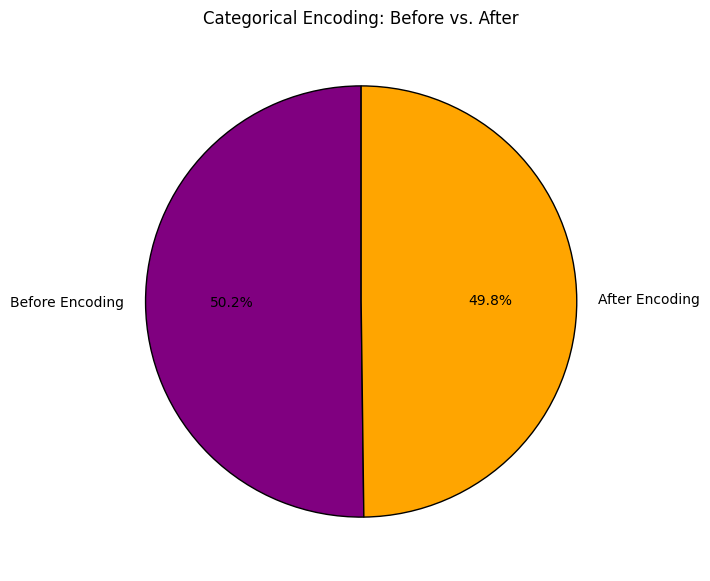

In [15]:
# Count unique categorical values before encoding
cat_cols = ["make", "model", "dealer_city"]
unique_before = sum(df[col].nunique() for col in cat_cols)

# Perform encoding
df_encoded = pd.get_dummies(df, columns=cat_cols, drop_first=True)
unique_after = df_encoded.shape[1] - df.shape[1]  # Number of new columns added

# Pie Chart Data
labels = ["Before Encoding", "After Encoding"]
values = [unique_before, unique_after]
colors = ['purple', 'orange']

# Plot Pie Chart
plt.figure(figsize=(7, 7))
plt.pie(values, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, wedgeprops={"edgecolor": "black"})
plt.title("Categorical Encoding: Before vs. After")
plt.show()


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



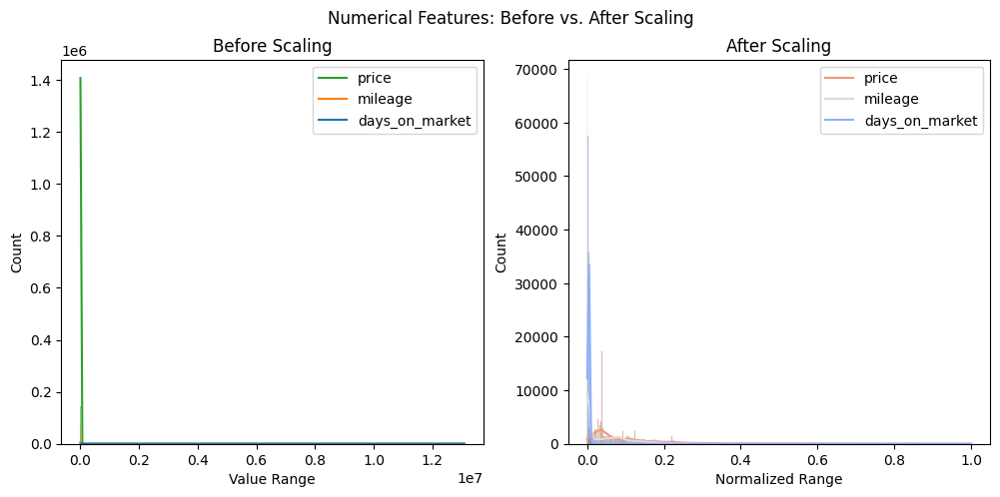

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Select numerical features
num_cols = ["price", "mileage", "days_on_market"]

# Apply Min-Max Scaling
scaler = MinMaxScaler()
df_scaled = df.copy()
df_scaled[num_cols] = scaler.fit_transform(df[num_cols])

# Plot Before vs. After Scaling
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Before Scaling
sns.histplot(df[num_cols], kde=True, ax=axes[0])
axes[0].set_title("Before Scaling")
axes[0].set_xlabel("Value Range")
axes[0].legend(num_cols)

# After Scaling
sns.histplot(df_scaled[num_cols], kde=True, ax=axes[1], palette="coolwarm")
axes[1].set_title("After Scaling")
axes[1].set_xlabel("Normalized Range")
axes[1].legend(num_cols)

plt.suptitle("Numerical Features: Before vs. After Scaling")
plt.show()


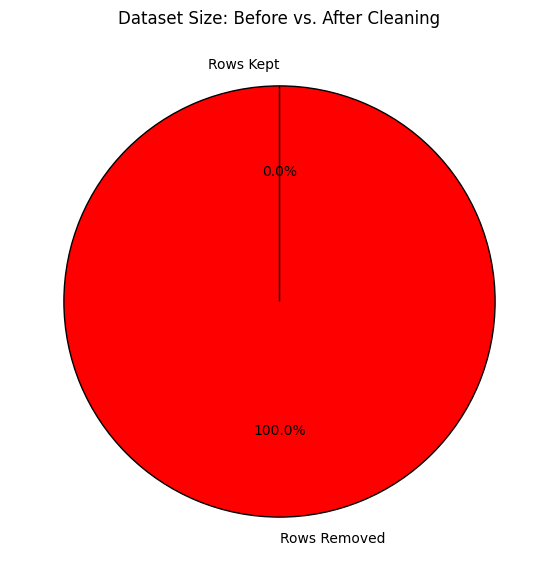

In [17]:
# Count total rows before and after data cleaning
rows_before = df.shape[0]

# Remove rows with missing values & outliers
df_cleaned = df.dropna()  # Removing missing values
df_cleaned = df_cleaned[(df_cleaned["price"] < 100000) & (df_cleaned["mileage"] < 300000)]  # Removing outliers
rows_after = df_cleaned.shape[0]

# Pie Chart Data
labels = ["Rows Removed", "Rows Kept"]
values = [rows_before - rows_after, rows_after]
colors = ["red", "green"]

# Plot Pie Chart
plt.figure(figsize=(7, 7))
plt.pie(values, labels=labels, autopct="%1.1f%%", colors=colors, startangle=90, wedgeprops={"edgecolor": "black"})
plt.title("Dataset Size: Before vs. After Cleaning")
plt.show()


In [18]:
!pip install dash
!pip install dash-leaflet
!pip install geocoder
!pip install plotly
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from scipy import stats
import dash
import dash.html as html
import dash.dcc as dcc
import dash_leaflet as dl
from dash.dependencies import Input, Output, State
import geocoder
import plotly.express as px
import plotly.graph_objects as go
from geopy.extra.rate_limiter import RateLimiter # to avoid overloading the server
from functools import lru_cache #used to cache the results

In [19]:
#LOAD POSTAL CODE.csv file
postal_codes = pd.read_csv('POSTAL_CODE.csv')
postal_codes.head(185)

#LOAD POSTAL CODE.csv file
postal_codes = pd.read_csv('POSTAL_CODE.csv')
postal_codes = postal_codes.rename(columns={'dealer_postal_code ': 'dealer_postal_code'})
# 2. Convert dealer_postal_code to string in df
df['dealer_postal_code'] = df['dealer_postal_code'].astype(str)

#

# 1. Create a dictionary of postal codes and coordinates
postal_code_dict = {
    'T5S 1Y8': (53.549233, -113.666536),
    'T6V 1H4': (53.604536, -113.578942),
    'T6H 1B7': (53.492482, -113.493143),
    'T6X 1A1': (53.421713, -113.48973),
    'T8N 7X1': (53.674928, -113.638065),
    'T5L 4H5': (53.591185, -113.564813),
    'T6E 0G7': (53.499461, -113.483908),
    'T8H 2N1': (53.546014, -113.327893),
    'T9E 6T9': (53.281782, -113.546323),
    'T5V 0C3': (53.576926, -113.589133),
    'T5L 5H7': (53.599913, -113.570655),
    'T5J 2E5': (53.544736, -113.491391),
    'T5J 2R7': (53.521746, -113.466265),
    'T5B 2N1': (53.567, -113.464409),
    'T6E 5P2': (53.466121, -113.472256),
    'T8H 0X5': (53.551967, -113.311705),
    'T8H 0R5': (53.556586, -113.310874),
    'T6H 1H1': (53.496786, -113.495747),
    'T6E 6A4': (53.46741, -113.474281),
    'T6H 4J7': (53.48981, -113.493039),
    'T5A 1C3': (53.592721, -113.428304),
    'T5Y 3B2': (53.599576, -113.417911),
    'T9E 0Z7': (53.278779, -113.545601),
    'T6E 5T6': (53.466958, -113.471536),
    'T5S 0A2': (53.559947, -113.62326),
    'T5E 4C7': (53.59468, -113.491331),
    'T5S 1E4': (53.542818, -113.625713),
    'T5B 1K3': (53.579197, -113.443474),
    'T6E 4C6': (53.514708, -113.498031),
    'T6E 5W8': (53.465953, -113.477218),
    'T9E 0W8': (53.333847, -113.542417),
    'T6E 6V6': (53.497962, -113.466073),
    'T5B 1G2': (53.582496, -113.481889),
    'T5S 1X2': (53.552158, -113.683096),
    'T7X 3A6': (53.545537, -113.903261),
    'T5L 4P6': (53.592173, -113.568713),
    'T5S 2C3': (53.542727, -113.694983),
    'T5R 1Y5': (53.520408, -113.589933),
    'T5B 1K2': (53.577026, -113.443418),
    'T6E 5P8': (53.478324, -113.481022),
    'T9E 7A7': (53.274779, -113.547858),
    'T8H 1N1': (53.558652, -113.325833),
    'T6H 2K4': (53.495635, -113.497162),
    'T5S 1S1': (53.542743, -113.631555),
    'T8L 3K8': (53.70586, -113.196872),
    'T6B 0G3': (53.517728, -113.441163),
    'T5S 1M9': (53.543904, -113.630355),
    'T5E 0E2': (53.585057, -113.525642),
    'T7X 6A5': (53.544574, -113.782322),
    'T6A 3A4': (53.542306, -113.444101),
    'T6E 5Z5': (53.486069, -113.477623),
    'T5H 0Y5': (53.552205, -113.51855),
    'T5H 3K1': (53.551929, -113.517376),
    'T6C 4H8': (53.511227, -113.441257),
    'T5B 0S4': (53.570172, -113.469567),
    'T5G 2Z1': (53.582161, -113.492898),
    'T5L 2L5': (53.598442, -113.579851),
    'T6V 1J1': (53.601613, -113.588422),
    'T9E 7L1': (53.289492, -113.54546),
    'T5G 0A8': (53.559383, -113.490767),
    'T5C 3C2': (53.584064, -113.444293),
    'T5L 2J8': (53.570641, -113.532039),
    'T8H 2A2': (53.543867, -113.318065),
    'T5S 1B1': (53.540351, -113.635669),
    'T6E 6G7': (53.468482, -113.489951),
    'T8N 2Y3': (53.619324, -113.6077),
    'T6N 1H8': (53.455708, -113.474548),
    'T9E 7A9': (53.277309, -113.548286),
    'T5S 1A4': (53.541938, -113.630124),
    'T5S 1C6': (53.539442, -113.638367),
    'T5B 0S9': (53.570228, -113.473859),
    'T6W 3G9': (53.428507, -113.590232),
    'T6N 1C1': (53.46373, -113.468913),
    'T5W 1A8': (53.570096, -113.411217),
    'T7X 2Y3': (53.54566, -113.9026),
    'T6E 5X9': (53.467055, -113.482628),
    'T6K 4E7': (53.483413, -113.443877),
    'T5B 4G9': (53.573829, -113.460508),
    'T6X 0S8': (53.426818, -113.489199),
    'T5G 0H8': (53.560534, -113.522931),
    'T6B 2H8': (53.513129, -113.407747),
    'T6E 6J6': (53.469156, -113.481194),
    'T5G 0B1': (53.559035, -113.492552),
    'T5B 1Y2': (53.571448, -113.451741),
    'T6E 3J2': (53.494776, -113.478623),
    'T8H 1B4': (53.554424, -113.319586),
    'T6E 2B1': (53.517704, -113.507252),
    'T6E 0X6': (53.507795, -113.507911),
    'T6E 0K9': (53.50231, -113.488079),
    'T6B 2J8': (53.508366, -113.419273),
    'T5G 1R2': (53.571235, -113.488478),
    'T6E 4P2': (53.498291, -113.459814),
    'T5B 1K1': (53.577413, -113.442568),
    'T5S 1R1': (53.542936, -113.629053),
    'T5V 1K8': (53.577274, -113.586491),
    'T8H 0C7': (53.546738, -113.330088),
    'T6J 6V4': (53.46246, -113.495135),
    'T5S 1P9': (53.542817, -113.63037),
    'T5B 0C4': (53.560843, -113.482261),
     'T5W 1G3': (53.570648, -113.440594),
    'T5B 1N2': (53.580492, -113.444054),
    'T6H 2K8': (53.498717, -113.496086),
    'T5S 2A1': (53.549727, -113.686217),
    'T6E 5A6': (53.489161, -113.474521),
    'T5S 2X1': (53.561611, -113.616362),
    'T5E 6M7': (53.584443, -113.489058),
    'T5S 0B9': (53.54432, -113.641427),
    'T5A 2W9': (53.585779, -113.415452),
    'T5G 3E5': (53.582625, -113.490243),
    'T6B 0B7': (53.513004, -113.441454),
    'T8L 3V5': (53.701823, -113.203532),
    'T5S 1N9': (53.543524, -113.61727),
    'T8A 4N5': (53.513148, -113.325929),
    'T6H 4J8': (53.491305, -113.496239),
    'T8H 0E1': (53.568231, -113.311384),
    'T5C 0A3': (53.58571, -113.443361),
    'T5L 2J7': (53.588151, -113.576664),
    'T8N 3Z7': (53.625671, -113.637513),
    'T5A 1C2': (53.593061, -113.430422),
    'T6W 2P6': (53.422385, -113.497227),
    'T5W 1E5': (53.570063, -113.431555),
    'T6A 0A7': (53.537893, -113.439521),
    'T5E 4C9': (53.59329, -113.49307),
    'T5E 1Y8': (53.598817, -113.494524),
    'T9E 8A5': (53.294746, -113.545184),
    'T6H 5W5': (53.48916, -113.491158),
    'T5B 0S6': (53.570187, -113.470844),
    'T5S 1N4': (53.541463, -113.632697),
    'T5T 3J7': (53.522335, -113.622923),
    'T5H 2S8': (53.556703, -113.494246),
    'T5S 0A1': (53.559087, -113.624689),
    'T8L 0P6': (53.674443, -113.242826),
    'T6E 6S9': (53.467826, -113.47846),
    'T6E 6L1': (53.4683, -113.484201),
    'T6B 2H5': (53.509612, -113.415763),
    'T5S 1P5': (53.542662, -113.628141),
    'T5M 4G4': (53.563623, -113.579631),
    'T5S 2Y4': (53.539532, -113.651114),
    'T5S 1B4': (53.540342, -113.629705),
    'T9E 7C7': (53.282279, -113.546108),
    'T5S 1A7': (53.542411, -113.638397),
    'T6V 1H5': (53.607832, -113.587096),
    'T6E 5R2': (53.478723, -113.477049),
    'T7X 5A3': (53.563063, -113.766949),
    'T6B 2T4': (53.533363, -113.416531),
    'T6X 1E9': (53.422085, -113.474242),
    'T5H 2G1': (53.559576, -113.486317),
    'T6E 4W8': (53.487292, -113.477167),
    'T6B 2Z9': (53.508912, -113.434842),
    'T8H 0M2': (53.56693, -113.313956),
    'T5S 2X6': (53.540246, -113.64364),
    'T8N 3X9': (53.666385, -113.628717),
    'T5S 0J5': (53.559002, -113.61948),
    'T6E 6B3': (53.469841, -113.480067),
    'T5E 4C4': (53.59035, -113.49115),
    'T8N 5A5': (53.636964, -113.570135),
    'T5P 4M9': (53.539746, -113.612409),
    'T5B 4H8': (53.582498, -113.449686),
    'T5M 2R8': (53.559574, -113.596458),
    'T5G 0N8': (53.570173, -113.487994),
    'T6B 3L9': (53.494061, -113.44116),
    'T5S 2C8': (53.545649, -113.622794),
    'T6E 4N7': (53.502571, -113.450468),
    'T9G 1B2': (53.366867, -113.734055),
    'T5L 3C1': (53.582383, -113.550417),
    'T6E 5X8': (53.466829, -113.475741),
    'T5S 0A8': (53.560491, -113.618451),
    'T6H 2H3': (53.495249, -113.491547),
    'T6H 5X8': (53.490051, -113.496852),
    'T5L 4P3': (53.597906, -113.575949),
    'T5H 0Y5': (53.552205, -113.51855),
    'T5L 2Y6': (53.576502, -113.574076),
    'T6H 2J4': (53.489435, -113.494305),
    'T6E 6G4': (53.496501, -113.463115),
    'T5H 2F8': (15.1617382, 105.2236161),
    'T5L 3C5': (53.582267, -113.572812),
    'T6C 4A5': (53.509855, -113.438178),
    'T9E 0R8': (53.291928, -113.530521),
    'T5S 0A6': (53.558529, -113.638664),
    'T6W 1A1': (53.420286, -113.494915),
    'T5L 2G7': (53.571387, -113.566433),
    'T5G 0N9': (53.570162, -113.489783),
    'T5S 1B4': (53.540342, -113.629705),
    'T5S 0A1': (53.559087, -113.624689),
    'T5S 1A7': (53.542411, -113.638397)
    # (all 185 postal codes and coordinates)
}

# 3. Convert dealer_postal_code to string in df
df['dealer_postal_code'] = df['dealer_postal_code'].astype(str)

# 4. Update df with coordinates using the dictionary
df['latitude'] = df['dealer_postal_code'].map(lambda x: postal_code_dict.get(x, (None, None))[0])
df['longitude'] = df['dealer_postal_code'].map(lambda x: postal_code_dict.get(x, (None, None))[1])


In [20]:
# Filter for sold and new vehicles
sold_new_vehicles = df[(df['listing_type'] == 'Sold') & (df['stock_type'] == 'New')]

# Group by postal code and count sold vehicles
postal_code_sales = sold_new_vehicles.groupby('dealer_postal_code')['listing_type'].count().reset_index()
postal_code_sales = postal_code_sales.rename(columns={'listing_type': 'total_vehicles_sold'})



In [21]:
# Filter for sold vehicles
sold_vehicles = df[df['listing_type'] == 'Sold'].copy() # Creating a copy of the slice

# --- Calculate total_vehicles_sold and most_sold_brand ---
dealership_sales = sold_vehicles.groupby('dealer_name')['listing_type'].count().reset_index()
dealership_sales = dealership_sales.rename(columns={'listing_type': 'total_vehicles_sold'})

# Group by brand and dealership, and count sold vehicles
brand_dealership_sales = sold_vehicles.groupby(['make', 'dealer_name'])['listing_type'].count().reset_index()
brand_dealership_sales = brand_dealership_sales.rename(columns={'listing_type': 'brand_vehicles_sold'})

# Find the most sold brand for each dealership
most_sold_brands_by_dealership = brand_dealership_sales.loc[brand_dealership_sales.groupby('dealer_name')['brand_vehicles_sold'].idxmax()]

# Merge with total_vehicles_sold DataFrame
combined_sales = pd.merge(dealership_sales, most_sold_brands_by_dealership[['dealer_name', 'make', 'brand_vehicles_sold']], on='dealer_name', how='left')

# Rename the 'make' column to 'most_sold_brand' for clarity
combined_sales = combined_sales.rename(columns={'make': 'most_sold_brand'})

# --- Merge total_vehicles_sold and most_sold_brand into df ---
# Drop any existing columns to avoid duplicates
df = df.drop(columns=['total_vehicles_sold', 'total_vehicles_sold_x', 'total_vehicles_sold_y', 'most_sold_brand'], errors='ignore')

# Merge the combined_sales data into df
df = pd.merge(df, combined_sales[['dealer_name', 'total_vehicles_sold', 'most_sold_brand']], on='dealer_name', how='left')

# --- Calculate and merge total_revenue ---
sold_vehicles.loc[:, 'revenue'] = sold_vehicles['price']  # Using .loc for assignment
dealership_revenue = sold_vehicles.groupby('dealer_name')['revenue'].sum().reset_index()
dealership_revenue = dealership_revenue.rename(columns={'revenue': 'total_revenue'})

# Drop any existing total_revenue column
df = df.drop(columns=['total_revenue'], errors='ignore')
df = pd.merge(df, dealership_revenue, on='dealer_name', how='left')

# --- Calculate and merge avg_days_on_market ---
average_days_on_market = df.groupby('dealer_name')['days_on_market'].mean().reset_index()
average_days_on_market = average_days_on_market.rename(columns={'days_on_market': 'avg_days_on_market'})

# Drop any existing avg_days_on_market columns
df = df.drop(columns=['avg_days_on_market', 'avg_days_on_market_x', 'avg_days_on_market_y'], errors='ignore')
df = pd.merge(df, average_days_on_market, on='dealer_name', how='left')

# Now convert to integer and then to string
df['avg_days_on_market'] = df['avg_days_on_market'].astype(int).astype(str)

df['total_vehicles_sold'] = df['total_vehicles_sold'].fillna(0)

In [22]:
#Create a MAP to display Region by Postal code
# Assuming 'dealer_city' or another column represents the region, replace 'Region' with that column name
fig = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    color="total_vehicles_sold",
    size="total_vehicles_sold",
    hover_name="dealer_postal_code",
    hover_data=["dealer_city", "total_vehicles_sold"],  # Replace 'Region' with 'dealer_city' or the relevant column
    color_continuous_scale=px.colors.sequential.Viridis,
    size_max=20,  # Adjust marker size as needed
    zoom=9,
    mapbox_style="carto-positron",
    center={"lat": 53.5461, "lon": -113.4938},  # Center on your area
)
fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        zoom=10,
        style="carto-positron",
        center=dict(lat=53.5461, lon=-113.4938)
    ),

)
fig.show(config={'scrollZoom': True} )

In [23]:
# Save the Output as Final_features csv
df.to_csv('Final_features.csv', index=False)